In [3]:
import numpy as np
import cv2
import glob
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import matplotlib.cm as cm
import math
from collections import defaultdict
import operator

%matplotlib inline

In [4]:
check_imgs = ["camera_cal/calibration"+str(i)+".jpg" for i in range(1,21)]
grid_sizes = [(9,5),(9,6),(9,6),(6,5),(7,6)]+ [(9,6)]*15

def calibration_matrix(imgs, grid_sizes):
    objpoints = []
    imgpoints = []
    for idx, fname in enumerate(imgs):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        grid_size = grid_sizes[idx]
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, grid_size, None)

        # If found, add object points, image points
        if ret == True:
            objp = np.zeros((grid_size[0]*grid_size[1],3), np.float32)
            objp[:,:2] = np.mgrid[0:grid_size[0], 0:grid_size[1]].T.reshape(-1,2)

            objpoints.append(objp)
            imgpoints.append(corners)
            # Draw and display the corners
#             cv2.drawChessboardCorners(img, grid_size, corners, ret)
#             write_name = 'camera_cal/corners_found'+str(idx+1)+'.jpg'
#             cv2.imwrite(write_name, img)
    #         cv2.imshow('img', img)
    #         cv2.waitKey(500)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return (mtx,dist)

In [5]:
mtx, dist = calibration_matrix(check_imgs,grid_sizes)

In [ ]:
for idx, fname in enumerate(check_imgs):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    ax2.imshow(dst)
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.savefig(fname[:-4]+"_compare.jpg")

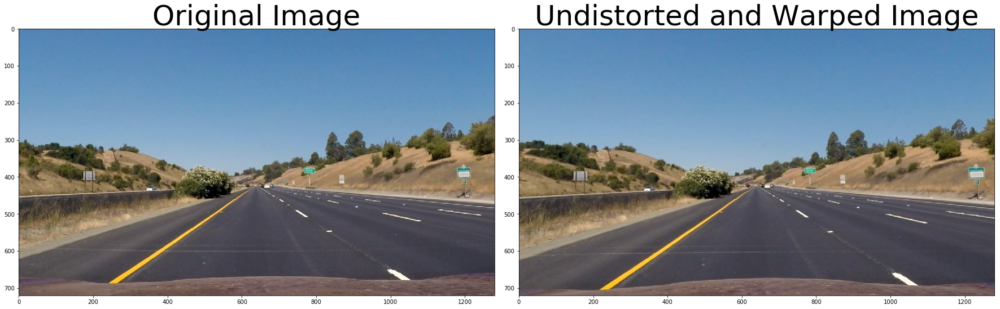

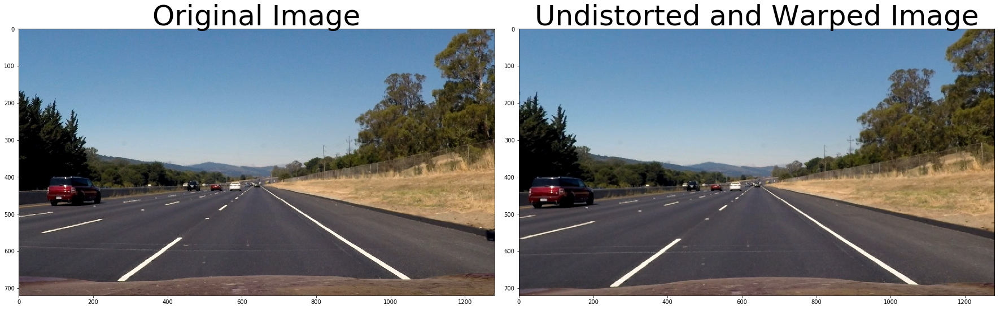

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


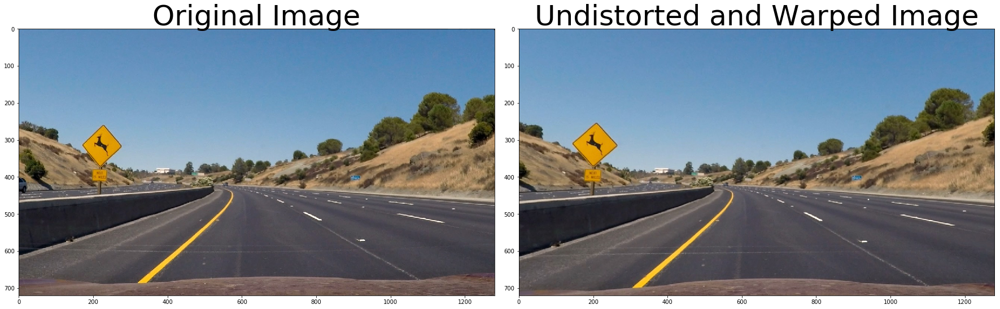

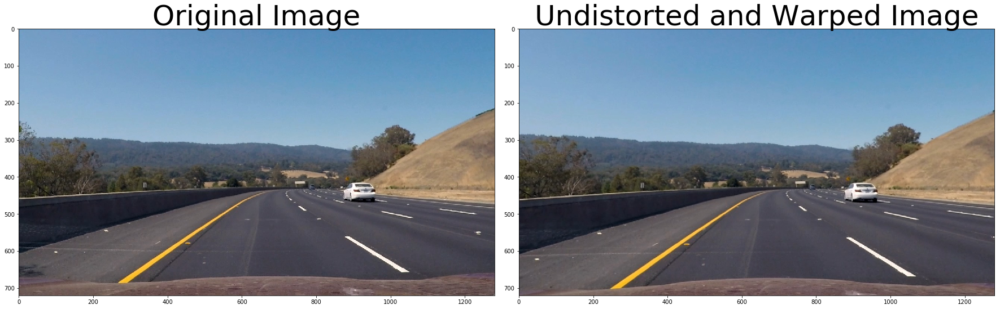

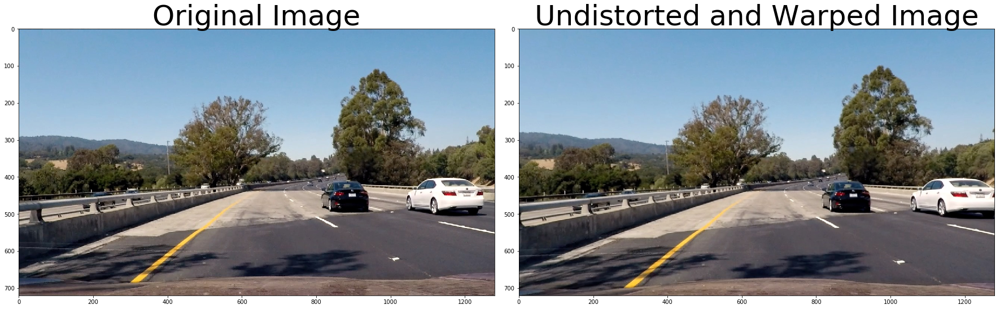

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


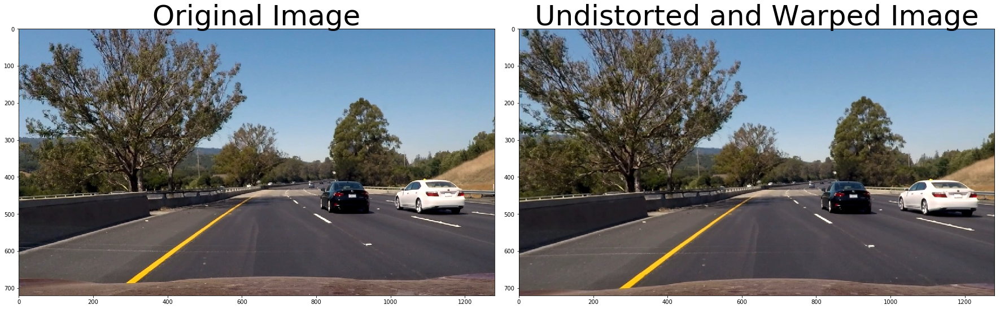

In [159]:
for fname in glob.glob("test_images/*.jpg"):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    ax2.imshow(dst)
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.savefig(fname[:-4]+"_compare.jpg")

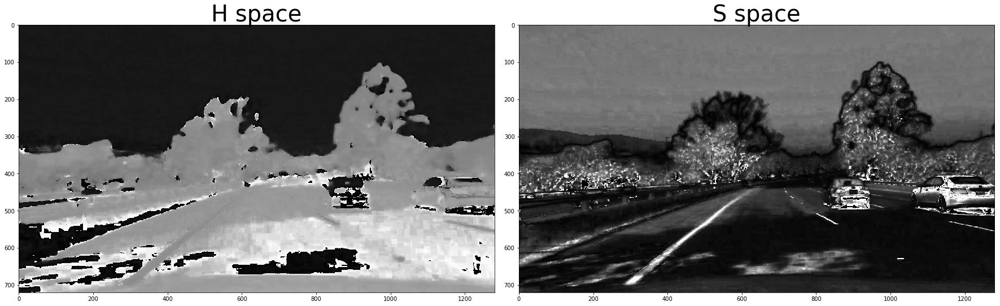

In [43]:
warped = cv2.undistort(cv2.imread('test_images/test4.jpg'), mtx, dist, None, mtx)

# Convert to HLS color space and separate the V channel
hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS).astype(np.float)# plt.imshow(result[:,:,2])
# Plot the result
# print(np.min(hls[:,:,1]),np.max(hls[:,:,1]))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(hls[:,:,0], cmap=cm.gray)
ax1.set_title('H space', fontsize=40)
ax2.imshow(hls[:,:,2], cmap=cm.gray)
ax2.set_title('S space', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [66]:
white = np.uint8([[[25, 25, 25]]])
cv2.cvtColor(white, cv2.COLOR_RGB2HLS).astype(np.float)

array([[[  0.,  25.,   0.]]])

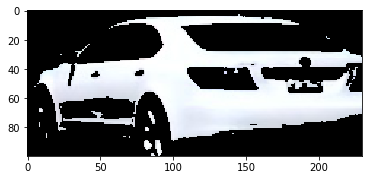

In [55]:

masked = warped.copy()
masked[:,:,0][(warped[:,:,0]<210) | (warped[:,:,1]<210) | (warped[:,:,2]<210)] =0
masked[:,:,1][(warped[:,:,0]<210) | (warped[:,:,1]<210) | (warped[:,:,2]<210)] =0
masked[:,:,2][(warped[:,:,0]<210) | (warped[:,:,1]<210) | (warped[:,:,2]<210)] =0

plt.imshow(masked[400:500,1050:,:])

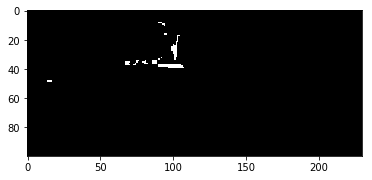

In [68]:
white_blobs = np.zeros_like(warped[:,:,1])
white_blobs[(warped[:,:,0]==255) & (warped[:,:,1]==255) & (warped[:,:,2]==255)] =1
plt.imshow(white_blobs[400:500,1050:], cmap=cm.gray)

In [57]:
tmp = masked[400:500,1050:,:]
tmp[60,100,:]

array([245, 253, 255], dtype=uint8)

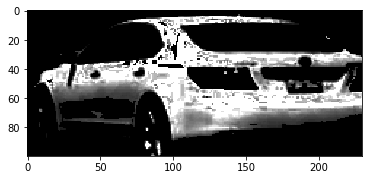

In [60]:
testhls = cv2.cvtColor(tmp, cv2.COLOR_RGB2HLS).astype(np.float)
plt.imshow(testhls[:,:,2]/255, cmap=cm.gray)

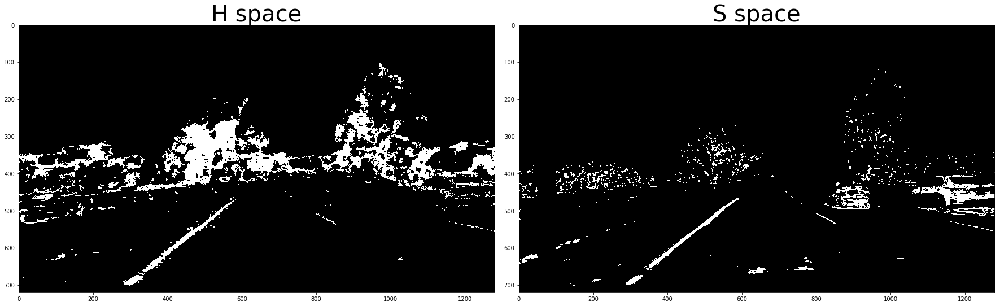

In [40]:
def pipeline(img, mtx, dist, s_thresh=(170, 255), 
             h_thresh=(18, 25), ang_thresh=(0.5, math.pi/2),
             ksize=3):
    r_channel = img[:,:,2]
    img = cv2.undistort(img, mtx, dist, None, mtx)

    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    s_channel = hls[:,:,2]
    
    # Threshold hue channel, filter only yellow and white
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel>h_thresh[0]) & (h_channel<=h_thresh[1])] = 1
       
    # Sobel
    sobelx = cv2.Sobel(h_channel, cv2.CV_64F, 1, 0, ksize=ksize) # Take the derivative in x
    sobely = cv2.Sobel(h_channel, cv2.CV_64F, 0, 1, ksize=ksize) # Take the derivative in y
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    abs_sobely = np.absolute(sobely) # Absolute y derivative to accentuate lines away from horizontal
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
    
    mg = np.sqrt(np.square(abs_sobelx)+np.square(abs_sobely))
    mg = np.int8(mg*255/np.max(mg))
    
    angle = np.arctan2(abs_sobely, abs_sobelx)

    # Threshold x gradient
#     sxbinary = np.zeros_like(scaled_sobelx)
#     sxbinary[(scaled_sobelx >= sx_thresh[0]) & (scaled_sobelx <= sx_thresh[1])
#              & (angle>ang_thresh[0]) & (angle<=ang_thresh[1])] = 1
    
    # Threshold saturation channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1]) | s_channel==0] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(h_binary), h_binary, s_binary))
    return color_binary
    
img = cv2.imread('test_images/test4.jpg')
result = pipeline(img, mtx, dist, s_thresh=(150, 255))
# plt.imshow(result[:,:,2])
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(result[:,:,1], cmap=cm.gray)
ax1.set_title('H space', fontsize=40)
result[100:800,50:100,:] = 0
result[900:1000,50:100,:] = 255
ax2.imshow(result[:,:,2], cmap=cm.gray)
ax2.set_title('S space', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [69]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [90]:
def get_red_image(image):
    i = 1
    print(image[10,10,:])
    return np.dstack(( image[:,:,i], image[:,:,i], image[:,:,i]))

In [91]:
challenge_output = 'challenge_video_green.mp4'

clip2 = VideoFileClip('challenge_video.mp4')
challenge_clip = clip2.fl_image(get_red_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

[ 54 110 166]
[MoviePy] >>>> Building video challenge_video_green.mp4
[MoviePy] Writing video challenge_video_green.mp4


  2%|▏         | 10/485 [00:00<00:04, 98.37it/s]

[ 54 110 166]
[ 56 109 166]
[ 56 109 166]
[ 54 110 166]
[ 54 110 166]
[ 52 108 162]
[ 52 108 162]
[ 50 108 162]
[ 51 109 163]
[ 51 109 163]
[ 53 109 163]
[ 51 109 163]
[ 51 109 163]
[ 52 110 164]
[ 51 109 163]
[ 54 110 164]
[ 54 110 164]
[ 53 109 163]
[ 53 109 163]
[ 53 109 163]
[ 51 109 163]
[ 51 109 163]
[ 53 109 163]
[ 53 109 163]
[ 54 110 164]


  8%|▊         | 38/485 [00:00<00:04, 111.07it/s]

[ 51 109 163]
[ 55 108 163]
[ 55 108 163]
[ 55 108 163]
[ 53 109 163]
[ 51 109 163]
[ 51 109 163]
[ 51 109 163]
[ 51 109 163]
[ 50 110 163]
[ 50 110 163]
[ 50 110 163]
[ 53 109 163]
[ 53 109 163]
[ 53 109 163]
[ 51 109 163]
[ 51 109 163]
[ 51 109 163]
[ 51 109 163]
[ 55 108 163]
[ 53 109 163]
[ 55 108 163]


 11%|█▏        | 55/485 [00:00<00:05, 78.07it/s] 

[ 51 109 163]
[ 51 109 163]
[ 53 109 163]
[ 53 109 163]
[ 51 109 163]
[ 51 109 163]
[ 52 110 164]
[ 51 111 164]
[ 51 111 164]
[ 51 109 163]
[ 51 109 163]
[ 52 110 164]
[ 52 110 164]
[ 54 110 164]


 15%|█▍        | 71/485 [00:00<00:05, 71.57it/s]

[ 54 110 164]
[ 54 110 164]
[ 54 110 164]
[ 52 110 164]
[ 52 110 164]
[ 52 110 164]
[18 27 43]
[ 57 110 165]
[ 56 109 164]
[ 54 110 164]
[ 51 111 164]
[ 52 110 164]
[ 51 111 164]


 18%|█▊        | 85/485 [00:01<00:06, 60.73it/s]

[ 52 110 164]
[ 55 111 165]
[ 53 111 165]
[ 53 111 165]
[ 52 112 165]
[ 53 111 165]
[ 55 111 165]
[ 55 111 167]
[ 55 111 167]
[ 56 112 168]
[ 56 112 168]
[ 56 112 168]
[ 56 112 168]


 19%|█▉        | 92/485 [00:01<00:06, 60.13it/s]

[ 56 112 168]
[ 56 112 168]
[ 54 112 168]
[ 55 115 170]
[ 55 115 170]
[ 55 115 170]
[ 55 115 170]
[ 55 115 170]
[ 55 115 170]
[ 55 115 170]
[ 55 115 170]
[ 55 115 170]

 22%|██▏       | 106/485 [00:01<00:06, 59.94it/s]


[ 55 115 170]
[ 55 115 170]
[ 55 115 170]
[ 55 115 170]
[ 54 116 171]
[ 54 116 171]
[ 54 116 171]
[ 54 116 173]
[ 54 116 173]
[ 55 117 174]
[ 55 117 174]


 25%|██▍       | 119/485 [00:01<00:06, 55.26it/s]

[ 53 118 174]
[ 51 119 174]
[ 53 121 176]
[ 53 121 176]
[ 51 121 178]
[ 54 122 179]
[ 54 122 179]
[ 59 124 182]
[117 149 192]
[113 138 177]
[173 172 161]
[74 72 66]
[84 86 83]

 27%|██▋       | 132/485 [00:01<00:06, 54.11it/s]


[221 220 209]
[73 71 65]
[60 58 54]
[57 52 49]
[56 51 48]
[198 194 182]
[41 41 41]
[33 31 32]
[28 26 27]
[16 14 15]
[17 15 16]


 28%|██▊       | 138/485 [00:02<00:06, 51.94it/s]

[47 42 39]
[7 5 6]
[9 7 8]
[9 7 8]
[9 7 8]
[9 7 8]
[23 21 22]
[5 5 5]
[9 9 9]
[11 10 13]
[14 18 24]


 31%|███▏      | 152/485 [00:02<00:06, 55.13it/s]

[12 18 24]
[13 14 21]
[ 69 147 207]
[ 65 150 208]
[ 67 148 209]
[ 61 148 208]
[ 63 148 208]
[ 65 147 208]
[ 66 144 206]
[ 62 144 208]
[ 63 144 208]
[ 62 140 205]


 34%|███▍      | 164/485 [00:02<00:06, 48.03it/s]

[ 63 141 206]
[ 63 141 206]
[ 62 140 205]
[ 62 140 205]
[ 61 139 204]
[ 57 138 202]
[ 56 137 201]
[ 58 136 201]
[ 57 135 200]
[ 59 135 200]
[ 56 134 199]
[ 56 134 199]


 36%|███▋      | 176/485 [00:02<00:06, 47.10it/s]

[ 56 134 196]
[ 56 134 196]
[ 57 133 195]
[ 54 130 192]
[ 54 130 192]
[ 54 130 192]
[ 53 129 189]
[ 53 129 189]
[ 53 129 189]


 37%|███▋      | 181/485 [00:03<00:06, 47.03it/s]

[ 53 126 187]
[ 53 126 187]
[ 55 126 187]
[ 55 126 187]
[ 54 125 186]
[ 54 125 186]
[ 55 124 186]
[ 55 124 186]


 40%|███▉      | 193/485 [00:03<00:06, 46.53it/s]

[ 56 123 185]
[ 51 120 180]
[ 53 120 180]
[ 53 120 180]
[ 50 119 179]
[ 50 119 179]
[ 51 118 178]
[ 51 118 178]
[ 51 119 176]
[ 53 118 176]
[ 51 116 174]
[ 51 116 174]


 42%|████▏     | 205/485 [00:03<00:06, 44.74it/s]

[ 51 116 174]
[ 49 114 172]
[ 49 114 172]
[ 48 113 171]
[ 49 111 170]
[ 50 112 169]
[ 50 112 169]
[ 50 112 169]
[ 50 112 169]
[ 50 112 169]


 45%|████▍     | 218/485 [00:03<00:05, 47.41it/s]

[ 50 112 169]
[ 51 111 168]
[ 49 111 168]
[ 49 111 168]
[ 49 111 168]
[ 49 111 168]
[ 49 111 168]
[ 49 111 168]
[ 49 111 168]
[ 46 111 167]
[ 51 111 168]


 47%|████▋     | 230/485 [00:04<00:05, 50.98it/s]

[ 51 111 168]
[ 51 111 168]
[ 51 111 166]
[ 49 111 166]
[ 49 111 166]
[ 51 111 166]
[ 51 111 166]
[ 51 111 166]
[ 51 111 166]
[ 51 111 166]
[ 51 111 166]
[ 51 111 166]


 50%|████▉     | 241/485 [00:04<00:05, 44.71it/s]

[ 52 110 166]
[ 51 109 165]
[ 51 109 165]
[ 50 110 165]
[ 51 109 165]
[ 51 109 165]
[ 51 109 165]
[ 51 111 166]
[ 51 111 166]
[ 51 109 165]
[ 51 109 165]


 51%|█████     | 246/485 [00:04<00:05, 45.55it/s]

[ 51 109 165]
[ 50 110 165]
[ 50 110 165]
[ 50 110 165]
[ 51 111 166]
[ 51 111 166]
[ 51 111 166]
[ 50 110 165]
[ 50 110 165]
[ 50 110 165]


 53%|█████▎    | 257/485 [00:04<00:04, 46.45it/s]

[ 50 110 165]
[ 50 110 165]
[ 50 110 165]
[ 50 110 165]
[ 48 110 165]
[ 50 110 165]
[ 50 110 165]
[ 50 110 165]
[ 50 110 165]
[ 50 110 165]
[ 50 110 165]
[ 50 110 165]


 56%|█████▌    | 271/485 [00:04<00:04, 50.75it/s]

[ 50 110 165]
[ 51 109 165]
[ 51 109 165]
[ 50 110 165]
[ 50 110 165]
[ 52 110 166]
[ 52 110 164]
[ 52 110 164]
[ 51 111 166]
[ 51 111 166]
[ 52 110 166]


 58%|█████▊    | 283/485 [00:05<00:04, 48.79it/s]

[ 52 110 166]
[ 49 111 166]
[ 49 111 166]
[ 49 111 166]
[ 51 111 166]
[ 52 110 166]
[ 53 111 167]
[ 53 111 167]
[ 53 111 167]
[ 53 111 167]
[ 53 111 167]


 60%|██████    | 293/485 [00:05<00:04, 47.42it/s]

[ 55 111 167]
[ 53 111 167]
[ 52 112 167]
[ 52 112 167]
[ 53 111 167]
[ 54 110 164]
[ 54 110 164]
[ 53 109 163]
[ 53 109 163]
[ 53 109 163]
[ 51 109 163]

 63%|██████▎   | 306/485 [00:05<00:03, 53.27it/s]


[ 58 107 163]
[ 57 108 163]
[ 54 110 164]
[ 51 109 163]
[ 51 109 163]
[ 51 109 163]
[ 51 111 164]
[ 51 111 164]
[ 51 111 164]
[ 54 110 164]
[ 52 110 164]


 66%|██████▌   | 318/485 [00:05<00:03, 51.11it/s]

[ 54 110 164]
[ 52 110 164]
[ 52 110 164]
[ 52 110 164]
[ 52 110 164]
[ 51 111 164]
[ 52 110 164]
[ 52 110 164]
[ 52 110 164]
[ 54 110 164]
[ 52 110 164]
[ 51 111 164]
[ 53 111 167]

 68%|██████▊   | 331/485 [00:06<00:02, 51.79it/s]


[ 53 111 167]
[ 55 111 167]
[ 55 111 167]
[ 55 111 167]
[ 55 111 167]
[ 53 111 167]
[ 55 111 167]
[ 55 111 165]
[ 55 111 165]
[ 53 111 165]


 70%|███████   | 340/485 [00:06<00:02, 52.33it/s]

[ 53 111 165]
[ 53 111 165]
[ 53 111 165]
[ 57 110 165]
[ 57 110 165]
[ 60 109 165]
[ 59 110 165]
[ 57 110 165]
[ 57 110 165]
[ 58 111 166]
[ 56 112 166]
[ 58 111 166]


 73%|███████▎  | 353/485 [00:06<00:02, 54.78it/s]

[ 55 111 165]
[ 55 111 165]
[ 55 111 165]
[ 59 110 165]
[ 62 114 166]
[ 60 114 166]
[ 60 114 166]
[ 60 114 166]
[ 58 112 164]
[ 60 114 166]
[ 59 111 163]


 74%|███████▍  | 360/485 [00:06<00:02, 53.80it/s]

[ 59 111 163]
[ 61 111 164]
[ 62 114 164]
[ 62 114 164]
[ 63 113 164]
[ 63 113 164]
[ 60 112 164]
[ 57 111 163]
[ 60 114 166]
[ 60 114 166]
[ 62 114 166]
[ 60 114 166]
[ 60 114 166]


 77%|███████▋  | 373/485 [00:06<00:02, 55.50it/s]

[ 61 111 164]
[ 60 112 164]
[ 60 114 166]
[ 60 114 166]
[ 62 114 166]
[ 64 114 167]
[ 66 114 167]
[ 66 114 167]
[ 66 114 167]
[ 63 113 166]
[ 62 114 166]
[ 63 113 166]


 80%|███████▉  | 386/485 [00:07<00:01, 51.28it/s]

[ 61 111 164]
[ 62 114 166]
[ 60 114 166]
[ 62 114 166]
[ 62 114 166]
[ 64 114 167]
[ 63 115 167]
[ 63 115 167]
[ 64 114 167]
[ 64 114 167]


 82%|████████▏ | 399/485 [00:07<00:01, 52.44it/s]

[ 64 114 167]
[ 63 115 165]
[ 65 115 163]
[ 67 115 163]
[ 70 115 164]
[ 70 115 164]
[ 70 115 164]
[ 70 115 167]
[ 69 114 166]
[ 67 115 168]
[ 68 113 165]


 85%|████████▍ | 411/485 [00:07<00:01, 53.75it/s]

[ 69 114 163]
[ 73 116 161]
[ 70 115 162]
[ 81 122 165]
[ 67 115 163]
[ 66 114 165]
[ 61 115 167]
[ 63 115 167]
[ 64 116 168]
[ 66 116 169]
[ 70 115 162]
[ 76 119 164]


 87%|████████▋ | 424/485 [00:07<00:01, 56.83it/s]

[ 80 120 163]
[ 76 119 164]
[ 78 118 164]
[ 84 121 165]
[ 82 122 165]
[ 80 121 164]
[ 80 121 164]
[ 84 124 165]
[ 92 129 169]
[109 139 171]
[115 141 172]
[115 141 172]
[115 141 172]


 89%|████████▊ | 430/485 [00:07<00:01, 52.22it/s]

[113 142 172]
[112 142 172]
[112 142 172]
[123 147 176]
[129 151 178]
[134 152 178]
[134 152 178]
[136 152 176]
[147 158 181]
[151 160 179]
[151 160 179]


 91%|█████████ | 442/485 [00:08<00:00, 53.98it/s]

[151 160 179]
[151 160 179]
[151 160 179]
[149 158 174]
[152 161 177]
[155 164 183]
[155 164 183]
[155 164 183]
[155 164 183]
[155 164 183]
[155 164 183]
[150 162 180]


 94%|█████████▍| 455/485 [00:08<00:00, 50.66it/s]

[150 162 180]
[150 162 180]
[150 159 178]
[150 159 178]
[151 160 179]
[154 163 182]
[154 163 182]
[154 163 179]
[154 163 179]
[154 163 179]
[154 163 179]
[155 164 180]


 97%|█████████▋| 469/485 [00:08<00:00, 52.79it/s]

[155 164 180]
[155 164 180]
[157 166 182]
[159 167 183]
[159 167 183]
[159 167 183]
[159 167 183]
[159 167 183]
[159 167 183]
[159 167 183]


 98%|█████████▊| 475/485 [00:08<00:00, 52.01it/s]

[159 167 183]
[159 167 183]
[159 167 183]
[159 167 183]
[158 167 183]
[157 166 182]
[157 166 182]
[157 166 182]
[156 165 181]
[156 165 181]
[154 163 182]
[154 163 182]


100%|██████████| 485/485 [00:08<00:00, 54.45it/s]


[154 163 182]
[154 163 182]
[154 163 182]
[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_green.mp4 

CPU times: user 2.39 s, sys: 1.44 s, total: 3.83 s
Wall time: 9.66 s


In [87]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

Computer Perspective Tranformation

In [15]:
img_size = (720,720)

def perspective_transformation(target_img_size):
    src = np.array([[592, 453], 
                    [695,453],
                    [970, 630],
                    [348, 630]], dtype = "float32")

    h_margin = 200
    top_margin = 200
    bottom_margin = 30
    dst = np.array([[h_margin, top_margin], 
                    [target_img_size[0] - h_margin, top_margin],
                    [target_img_size[0] - h_margin, target_img_size[1] - bottom_margin],
                    [h_margin, target_img_size[1] - bottom_margin]], dtype = "float32")
    return cv2.getPerspectiveTransform(src, dst)

M = perspective_transformation(img_size)
M_inv = np.linalg.inv(M)

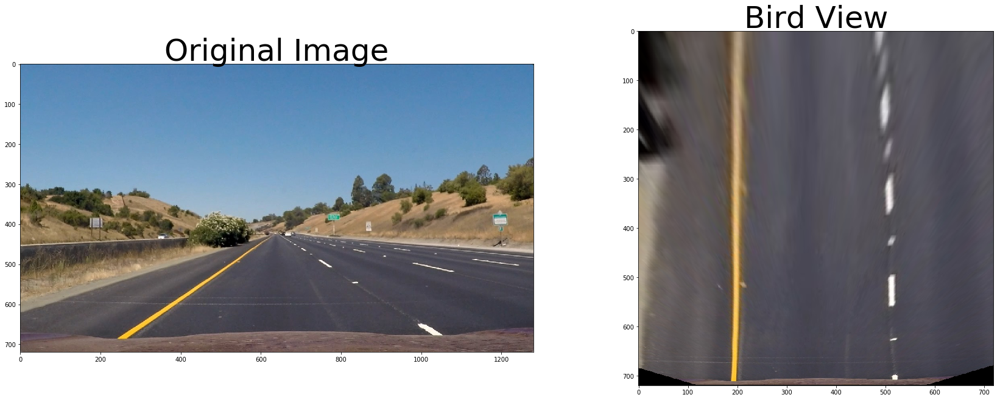

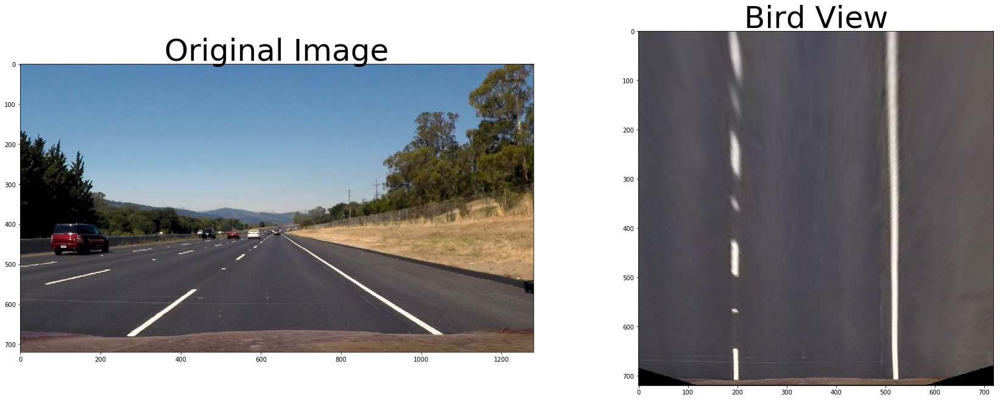

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


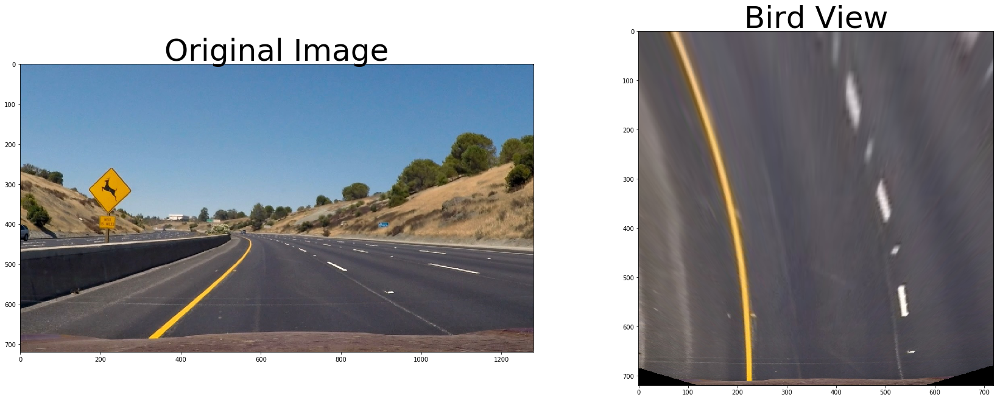

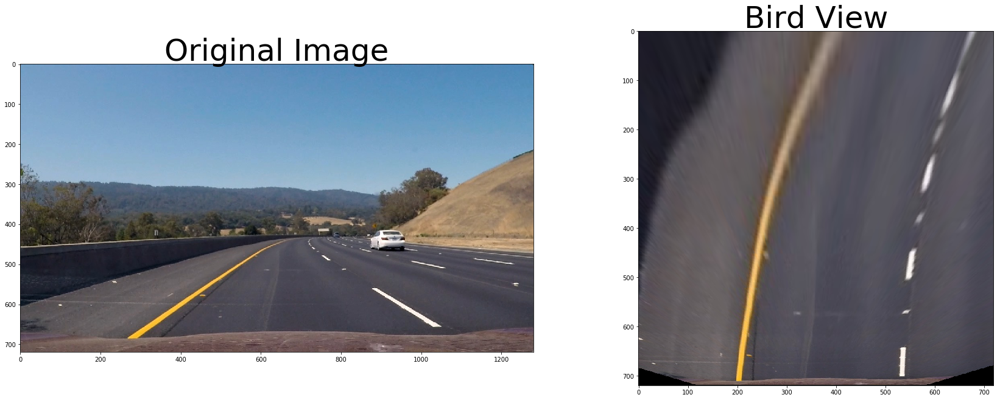

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


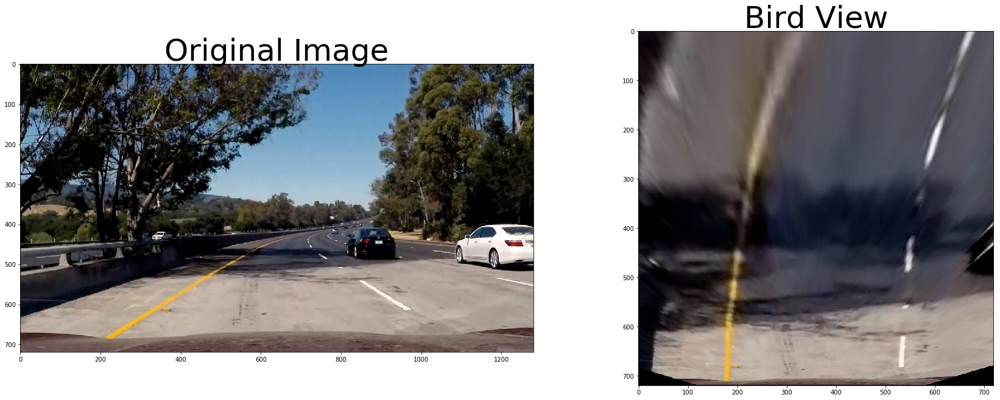

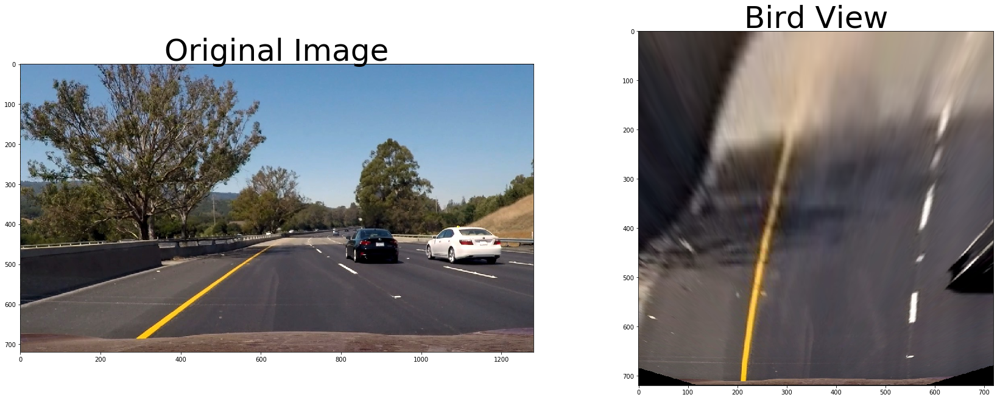

In [16]:
for fname in glob.glob("test_images/*.jpg"):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    ax2.imshow(warped)
    ax2.set_title('Bird View', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.savefig(fname[:-4]+"_compare.jpg")
    


In [ ]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    return cv2.addWeighted(initial_img, α, img, β, λ)

In [78]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sb = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    if orient == 'y':
        sb = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sb = np.absolute(sb)
    sc_sb = np.uint8(abs_sb*255/np.max(abs_sb))
    binary_output = np.zeros_like(sc_sb)
    binary_output[(sc_sb>thresh_min)&(sc_sb<thresh_max)]=1
    return binary_output

In [80]:
for fname in glob.glob('test_images/*.jpg'):
    img = cv2.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    gray_img = cv2.cvtColor(dst, cv2.COLOR_RGB2GRAY)
    denoised_img = cv2.GaussianBlur(gray_img, (5, 5), 0)
    edge_img = cv2.Canny(denoised_img,50,150)
    write_name = fname[:-4]+'_binary.jpg'
    cv2.imwrite(write_name, edge_img)

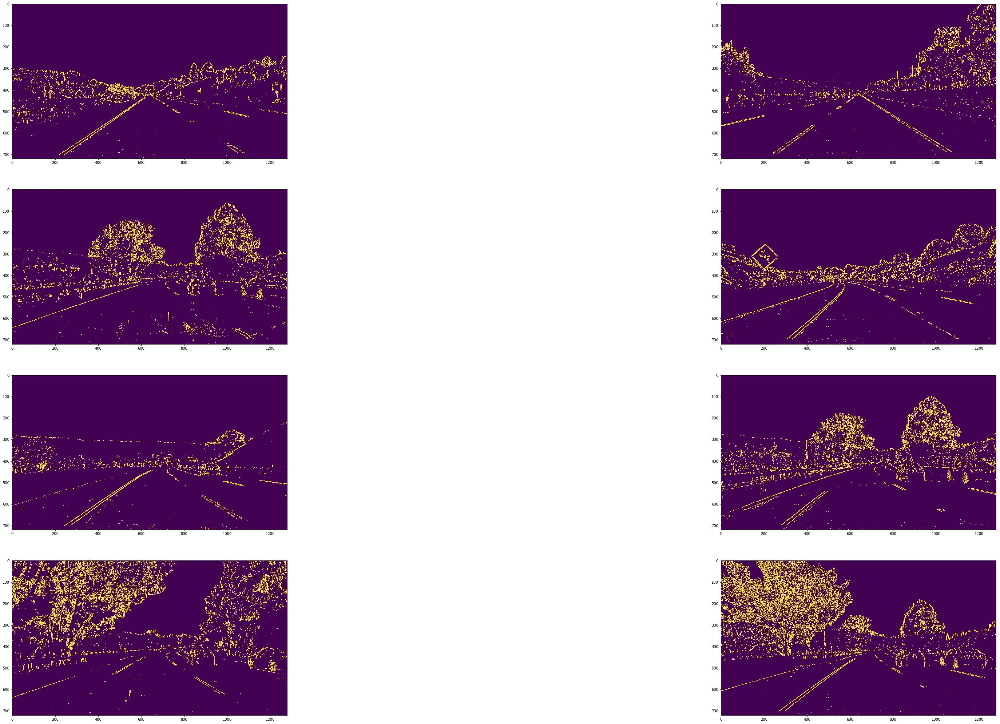

In [99]:
f, plots = plt.subplots(4, 2, figsize=(64, 36))
# f.tight_layout()

i = 0
for fname in glob.glob('test_images/*.jpg'):
    img = cv2.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    grad_binary = abs_sobel_thresh(dst, orient='x', thresh_min=20, thresh_max=100)
    plots[i//2][i%2].imshow(grad_binary)
    i += 1
#     write_name = fname[:-4]+'_sobel.jpg'
#     plt.imsave(write_name, grad_binary, cmap=cm.gray)
    

In [ ]:
for fname in glob.glob('test_images/*.jpg'):
    img = cv2.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    write_name = fname[:-4]+'_calibrated.jpg'
    cv2.imwrite(write_name, dst)
    

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

In [ ]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
plt.imshow(result)